#Code to check DMDs for individual TOV solutions

In [1]:
# Code edited from tovClass.py

import numpy as np
import sys
from scipy.integrate import solve_ivp, odeint
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d
from matplotlib.ticker import ScalarFormatter
from tqdm import tqdm
from scipy.sparse import diags
from scipy.optimize import fsolve
from scipy.optimize import minimize
# from cycler import cycler
sys.path.append('../src')
from tovScaledRev import TOV as TOV1
from scaledTOV import TOV

# constants
r0 = 8.378  # km
m0 = 2.837  # solar mass
alphaG = 5.922e-39  # constant
lambda_n = 2.10e-19  # km
rSun = 2.953  # Schwarzschild Radius of sun in km
eps0 = 1.285e3  # MeV/fm^3
pres0 = 1.285e3  # MeV/fm^3
msol = 1.116e60  # Mass of sun in MeV
Ggrav = 1.324e-42  # Mev^-1*fm
rsol = 2.954e18
# Schwarrzschild radius of the sun in fm
rhosol = msol * 3 / (4.0 * np.pi * rsol**3)

%load_ext autoreload
%autoreload 2

In [2]:
# tov = TOV("../EOS_files/sorted_Sly4.dat", 100)
tov1 = TOV1("../EOS_Data/sorted_Sly4.dat", 100, True)
R_max=20.0

In [3]:
pvals = np.geomspace(1e-3, 2.0, 30)
Sols_varying_p0=[]
Sols_varying_p0_1=[]

# Solve TOV equations for different central pressures
# and store the solutions in Sols_varying_p0
# returns rdata, pressure, mass
for p0 in tqdm(pvals):
    # result = tov.tovsolve(p0, R_max)
    result1 = tov1.tovsolve(p0)
    Sols_varying_p0_1.append(result1)
    # Sols_varying_p0.append(result)
    # print(result)
# print(Sols_varying_p0_1[0], len(Sols_varying_p0_1[0][0]))

  0%|          | 0/30 [00:00<?, ?it/s]

100%|██████████| 30/30 [00:01<00:00, 22.76it/s]


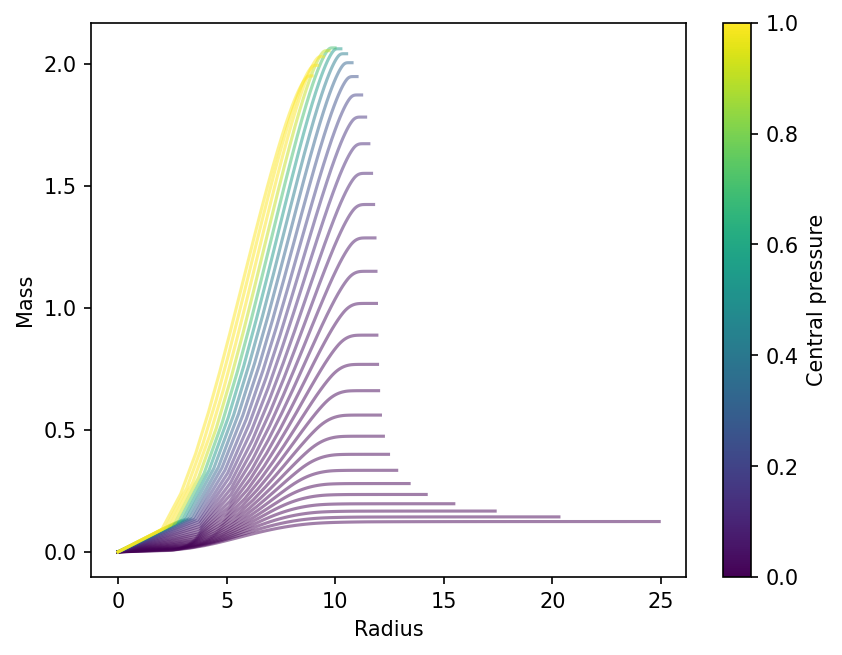

In [4]:
fig, ax = plt.subplots(dpi=150)

for i in range(len(Sols_varying_p0_1)):
    # ax.plot(Sols_varying_p0[i][0],Sols_varying_p0[i][2],'.', alpha=0.5,color=plt.cm.viridis(pvals[i]), label=f"R_{pvals[i]:.2f}")
    ax.plot(Sols_varying_p0_1[i][0],Sols_varying_p0_1[i][2], alpha=0.5,color=plt.cm.viridis(pvals[i]), label=f"P_{pvals[i]:.2f}")

sm = plt.cm.ScalarMappable(cmap='viridis')
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label('Central pressure')

ax.set_ylabel("Mass")
ax.set_xlabel("Radius")

# plt.legend(prop={"size": 4}, loc='upper right')
plt.savefig('../Plots/MvsR.pdf')
plt.show()

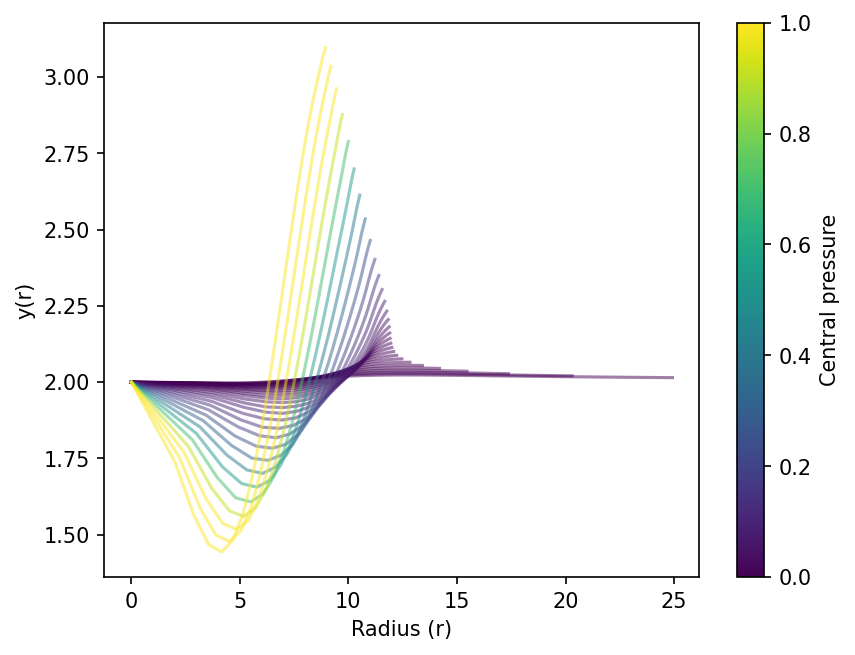

In [5]:
fig, ax = plt.subplots(dpi=150)

for i in range(len(Sols_varying_p0_1)):
    # ax.plot(Sols_varying_p0[i][0],Sols_varying_p0[i][2],'.', alpha=0.5,color=plt.cm.viridis(pvals[i]), label=f"R_{pvals[i]:.2f}")
    ax.plot(Sols_varying_p0_1[i][0],Sols_varying_p0_1[i][3], alpha=0.5,color=plt.cm.viridis(pvals[i]), label=f"P_{pvals[i]:.2f}")

sm = plt.cm.ScalarMappable(cmap='viridis')
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax)
cbar.set_label('Central pressure')

ax.set_ylabel("y(r)")
ax.set_xlabel("Radius (r)")

# plt.legend(prop={"size": 4}, loc='upper right')
plt.savefig('../Plots/MvsR.pdf')
plt.show()

In [6]:
from scipy.interpolate import interp1d
from scipy.interpolate import UnivariateSpline

intPres = []
intMasses = []
intRadii = []
idx = np.arange(100)



for i, sol in enumerate(Sols_varying_p0):
    x = np.linspace(0, 1, len(sol[0])) 
    y = Sols_varying_p0[i][0]
    spline = UnivariateSpline(x, y, s=0)  # s=0 for interpolation (through all points)
    x_new = np.linspace(0, 1, 40)  # Adjust 500 for more/less points
    r = spline(x_new)
    f_m = interp1d(sol[0], sol[2], kind='cubic', fill_value='extrapolate')
    f_p = interp1d(sol[0], sol[1], kind='cubic', fill_value='extrapolate')
    # f_r = interp1d(idx, sol[0], kind='cubic', fill_value='extrapol
    # r = np.geomspace(sol[0][-1], sol[0][0], len(Sols_varying_p0_1[i][0]))
    # r = Sols_varying_p0_1[i][0]
    m = f_m(r)
    p = f_p(r)
    signArray = (np.diff(np.sign(p)) != 0)*1
    intVal = np.where(signArray == 1)
    if intVal[0].size > 0:
        intPres.append(p[:intVal[0][0]])
        intMasses.append(m[:intVal[0][0]])
        intRadii.append(r[:intVal[0][0]])
    else:
        intPres.append(p)
        intMasses.append(m)
        intRadii.append(r)


In [7]:
# # plt.plot(Sols_varying_p0[-1][0], label = "dp/dr")
# plt.plot(Sols_varying_p0_1[-1][0], label = "dr/dp")
# plt.plot(intRadii[-1],'.', label = "dp/dr Interp")
# plt.legend()
# plt.show()

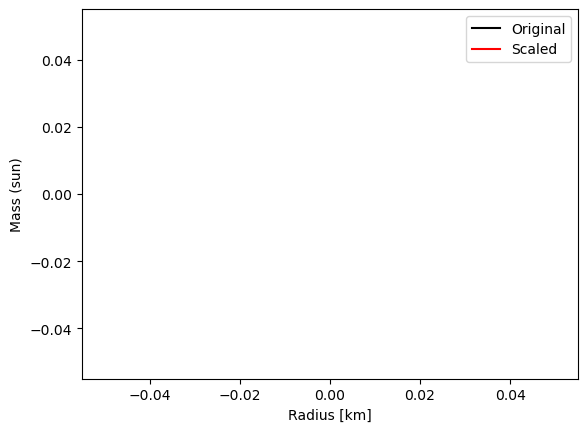

In [8]:
fig, ax = plt.subplots()
Masses=[]
Radii=[]
Masses1=[]
Radii1=[]
intMass = []
intRad = []
for i in range(len(Sols_varying_p0)):
    Masses.append(Sols_varying_p0[i][2][-1])
    Radii.append(Sols_varying_p0[i][0][-1])
    Masses1.append(Sols_varying_p0_1[i][2][-1])
    Radii1.append(Sols_varying_p0_1[i][0][-1])
    intMass.append(intMasses[i][-1])
    intRad.append(intRadii[i][-1])

ax.plot(Radii, Masses,label="Original",color='k')
# ax.scatter(Radii, Masses,color='k')
ax.plot(Radii1, Masses1,label="Scaled",color='r')
# ax.scatter(Radii1, Masses1,color='r')
# ax.plot(intRad, intMass,label="Interpolated",color='b')
ax.scatter(intRad, intMass,color='b')
# ax.set_yscale('log')
# ax.set_xlim(10,18)
ax.set_xlabel("Radius [km]")
ax.set_ylabel("Mass (sun)")
plt.legend()
plt.savefig("../Plots/massvsRad.pdf")
plt.show()

Testing r=1: Max absolute error = 26.101085
Testing r=2: Max absolute error = 72.601313
Testing r=3: Max absolute error = 81.930545
Testing r=4: Max absolute error = 61.668565
Testing r=5: Max absolute error = 53.854944
Testing r=6: Max absolute error = 21.568403
Testing r=7: Max absolute error = 26.955927
Testing r=8: Max absolute error = 75.425024
Testing r=9: Max absolute error = 67.640442
Testing r=10: Max absolute error = 66.760588
Testing r=11: Max absolute error = 21.221840
Testing r=12: Max absolute error = 29.219216
Testing r=13: Max absolute error = 4.054499
Testing r=14: Max absolute error = 0.009483
Optimal 'r' determined: 14 (Max absolute error = 0.009483)
Testing r=1: Max absolute error = 26.189881
Testing r=2: Max absolute error = 75.116449
Testing r=3: Max absolute error = 97.364998
Testing r=4: Max absolute error = 78.136321
Testing r=5: Max absolute error = 59.414890
Testing r=6: Max absolute error = 17.589804
Testing r=7: Max absolute error = 32.455990
Testing r=8: M

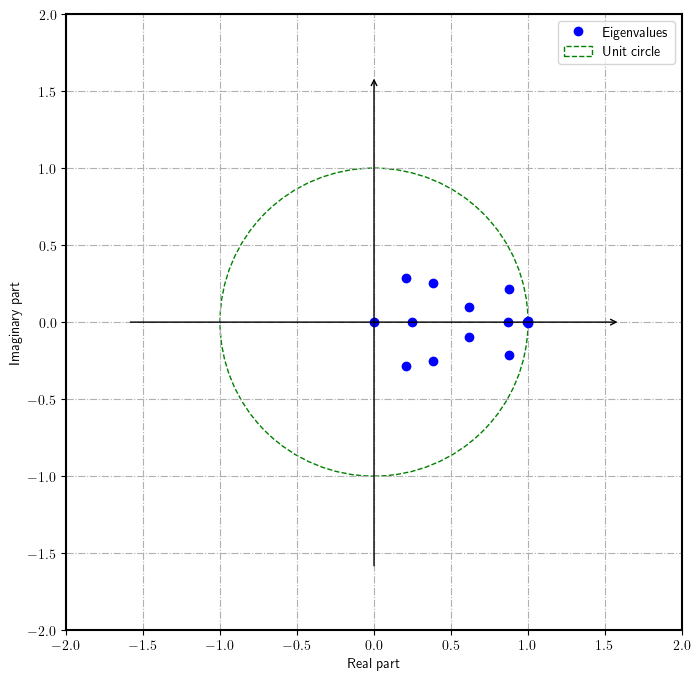

In [9]:
sys.path.append('../src')
import numpy as np
from SLM import SLM
from plotData import plot_eigs
from scripts import setup_rc_params
presDMDArray = []
radDMDArray = []
massDMDArray = []
yDMDArray = []
n = 2
# Order of data, r, p, m, rho
for i in range(len(Sols_varying_p0_1)):
    # print(len(intRadii[i][1:][::n]))
    # r = intRadii[i][1:][::n].copy()
    # p = intPres[i][1:][::n].copy()
    # m = intMasses[i][1:][::n].copy()
    r = Sols_varying_p0_1[i][0][::n].copy()   
    p = Sols_varying_p0_1[i][1][::n].copy()
    m = Sols_varying_p0_1[i][2][::n].copy()
    y = Sols_varying_p0_1[i][3][::n].copy()
    # eps = Sols_varying_p0[i][3][1:][::n].copy()
    # rho = Sols_varying_p0[i][3]
    # print('mass', m, p, r, m.shape, p.shape, r.shape)
    X = [np.log(r), np.log(p), np.log(m), np.log(y)]
    # X = [r, p, m]
    X = np.asarray(X, dtype=np.float64)
    
    # Filter out inf and NaN values
    # X = X[:, ~np.isnan(X).any(axis=0) & ~np.isinf(X).any(axis=0)]
    
    linT = np.arange(len(p))
    svdSize = 14
    phi, omega, lam, b, Xdmd, S, r_optimal = SLM(X, (linT[-1] - linT[0])/len(linT), error_threshold = 1e-6)
    rad_DMD = np.exp(Xdmd[0].real)
    pres_DMD = np.exp(Xdmd[1].real)
    mass_DMD = np.exp(Xdmd[2].real)
    y_dmd = np.exp(Xdmd[3].real)
    # print(rad_DMD)
    # rad_DMD = Xdmd[0].real
    # pres_DMD = Xdmd[1].real
    # mass_DMD = Xdmd[2].real
    # idx = np.where(np.array(pres_DMD>0))[0][-1]
    # print(idx, pres_DMD[:idx])

    # print(mass_DMD)
    presDMDArray.append(pres_DMD)
    radDMDArray.append(rad_DMD)
    massDMDArray.append(mass_DMD)
    yDMDArray.append(y_dmd)

    # presDMDArray.append(pres_DMD[:idx])
    # radDMDArray.append(rad_DMD[:idx])
    # massDMDArray.append(mass_DMD[:idx])

print("Lam", lam)
plot_eigs(lam)
# print(radDMDArray[0], massDMDArray[0], presDMDArray[0]) 

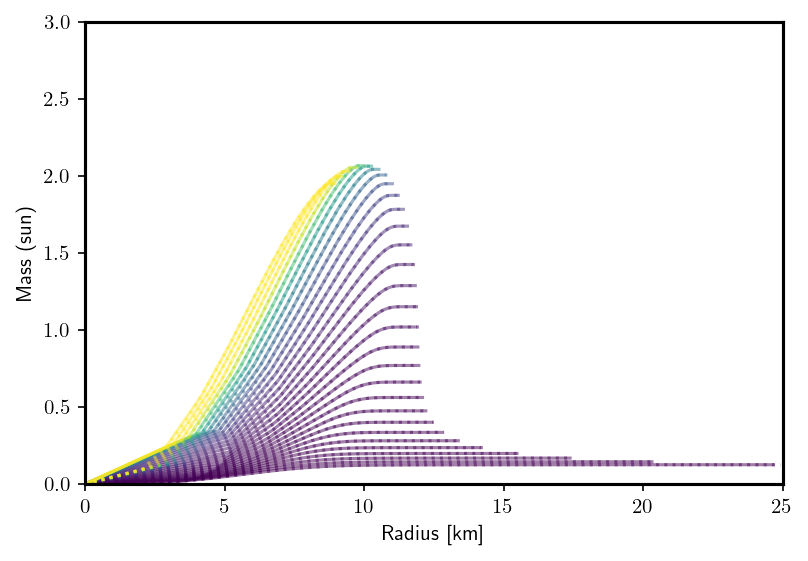

In [10]:
# Plot the data
fig, ax = plt.subplots(figsize=(6, 4), dpi=150)
for i in range(len(Sols_varying_p0_1)):
    ax.plot(Sols_varying_p0_1[i][0],Sols_varying_p0_1[i][2], alpha=0.5,color=plt.cm.viridis(pvals[i]),linestyle='dotted', label=f"{pvals[i]:.2f}")
    if i < len(radDMDArray) and i < len(massDMDArray):
        ax.plot(radDMDArray[i], massDMDArray[i], alpha=0.5,color=plt.cm.viridis(pvals[i]))

plt.xlim(0, 25)
plt.ylim(0, 3)
plt.xlabel("Radius [km]")
plt.ylabel("Mass (sun)")
# plt.yscale('log')
# plt.xscale('log')
# plt.legend()

plt.savefig("../Plots/massvsRadDMD.pdf")

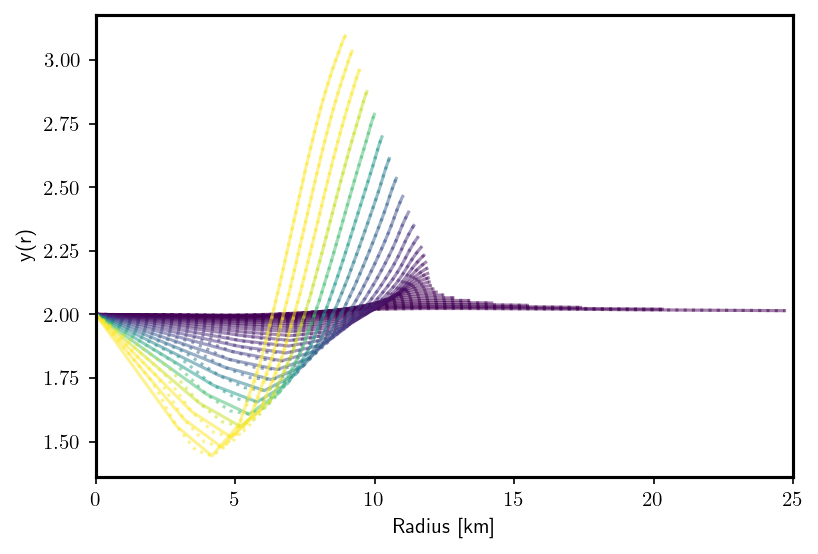

In [11]:
# Plot the data
fig, ax = plt.subplots(figsize=(6, 4), dpi=150)
for i in range(len(Sols_varying_p0_1)):
    ax.plot(Sols_varying_p0_1[i][0],Sols_varying_p0_1[i][3], alpha=0.5,color=plt.cm.viridis(pvals[i]),linestyle='dotted', label=f"{pvals[i]:.2f}")
    if i < len(radDMDArray) and i < len(massDMDArray):
        ax.plot(radDMDArray[i], yDMDArray[i], alpha=0.5,color=plt.cm.viridis(pvals[i]))

plt.xlim(0, 25)
# plt.ylim(1.8,4)
plt.xlabel("Radius [km]")
plt.ylabel("y(r)")
# plt.yscale('log')
# plt.xscale('log')
# plt.legend()

plt.savefig("../Plots/massvsRadDMD.pdf")

In [12]:
import os
from matplotlib.ticker import ScalarFormatter
import matplotlib as mpl
from matplotlib import pyplot as plt
import sys
sys.path.append("./../")
import scripts as plot_scripts  # plotting functions
plot_scripts.setup_rc_params()


In [13]:
# define some useful figure things
dpi = 600
figsize = (5, 5)  # Goddam that is one big fig. Might make one giant Newton.
save_figures = True
save_location = "./../Plots"

tov_alpha = 0.65
dmd_alpha = 0.8
res_alpha = 0.6
scatter_size = 20
tick_size = 24
axis_label_size = 24
res_axis_label_size = 18
tov_linewidth = 2
dmd_dot_size = 30
res_linewidth = 3
title_size = 24
legend_size = 8

res_width = "60%"
res_height = 2.5

/tmp/ipykernel_296347/941991665.py:117: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


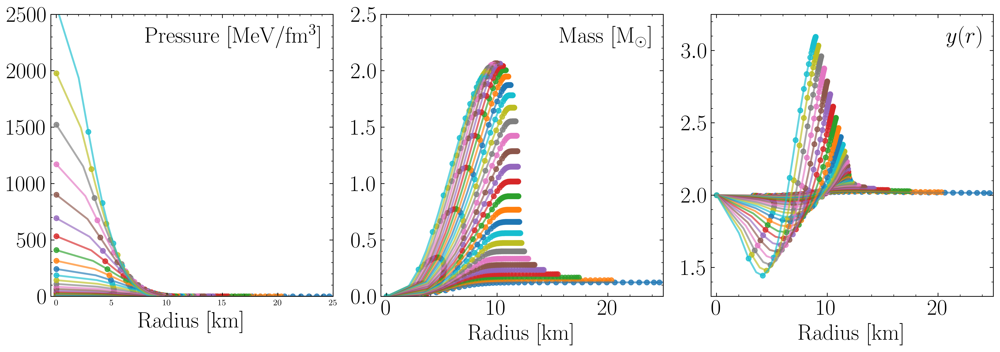

In [14]:
# number_of_lines_to_include = 5

import matplotlib.ticker

fig, ax = plt.subplots(1, 3, dpi=dpi, figsize=(3*figsize[1], figsize[0]))
i = 0
for exact_solution, emulated_solution in zip(Sols_varying_p0_1, zip(radDMDArray, presDMDArray, massDMDArray, yDMDArray)):
    
    # plots of exact and emulated solutions
    # P-R plot
    ax[0].plot(exact_solution[0], exact_solution[1]*pres0, 
               alpha=tov_alpha, linewidth=tov_linewidth, label=rf"{pvals[i]:.3f} ")
    ax[0].scatter(emulated_solution[0], emulated_solution[1]*pres0, 
               alpha=dmd_alpha, s=dmd_dot_size)
    # M-R plot
    ax[1].plot(exact_solution[0], exact_solution[2], 
               alpha=tov_alpha, linewidth=tov_linewidth)
    ax[1].scatter(emulated_solution[0], emulated_solution[2], 
               alpha=dmd_alpha, s=dmd_dot_size)
    # T-R plot
    ax[2].plot(exact_solution[0], exact_solution[3], 
               alpha=tov_alpha, linewidth=tov_linewidth)
    ax[2].scatter(emulated_solution[0], emulated_solution[3], 
               alpha=dmd_alpha, s=dmd_dot_size)
    
    # ax[0].plot(emulated_solution[0], emulated_solution[1]*pres0, 
    #            alpha=tov_alpha, linewidth=tov_linewidth, label=rf"{pvals[i]:.3f} ")
    # ax[0].scatter(exact_solution[0], exact_solution[1]*pres0, 
    #            alpha=dmd_alpha, s=dmd_dot_size)
    # # M-R plot
    # ax[1].plot(emulated_solution[0], emulated_solution[2], 
    #            alpha=tov_alpha, linewidth=tov_linewidth)
    # ax[1].scatter(exact_solution[0], exact_solution[2], 
    #            alpha=dmd_alpha, s=dmd_dot_size)
    # # T-R plot
    # ax[2].plot(emulated_solution[0], emulated_solution[3], 
    #            alpha=tov_alpha, linewidth=tov_linewidth)
    # ax[2].scatter(exact_solution[0], exact_solution[3], 
    #            alpha=dmd_alpha, s=dmd_dot_size)
    


    # calculation of interpolated exact solutions
    # MR_interpolated = the_good_interpolator(exact_solution[0])
    
    i += 1
#


ax[0].set_xlim(-0.5, 25)
# ax[0].set_xticks([])
# ax[0].set_ylabel("Pressure [MeV/fm$^3$]", fontsize=axis_label_size)
ax[0].text(0.65, 0.9, "Pressure [MeV/fm$^3$]", fontsize=axis_label_size, transform=ax[0].transAxes, ha='center')
ax[0].set_xlabel("Radius [km]", fontsize=axis_label_size)
# ax[0].set_yscale("log")
# ax[0].set_yticks([1, 10, 100, 1000], ["", "$10^1$", "$10^2$", "$10^3$"])
ax[0].set_ylim(0, 2500)
ax[0].tick_params(which='minor', length=2)
ax[0].tick_params(bottom=True, labelbottom=True,
               top=True, labeltop=False,
               right=True, labelright=False,)
ax[0].xaxis.set_minor_locator(matplotlib.ticker.AutoMinorLocator())  # get minor ticks on x-axis
ax[0].xaxis.set_ticks_position('both')  # get minor ticks on top and bottom sides
ax[0].yaxis.set_minor_locator(matplotlib.ticker.AutoMinorLocator())  # get minor ticks on y-axis
ax[0].yaxis.set_tick_params(labelsize=tick_size)
ax[0].yaxis.set_ticks_position('both')  # get minor ticks on left and right sides

ax[1].set_xlim(-0.5, 25)
# ax[1].set_xticks([])
ax[1].set_ylim(0, 2.5)
# ax[1].set_ylabel(r"Mass [$\rm{M}_{\odot}$]", fontsize=axis_label_size)
ax[1].text(0.8, 0.9, r"Mass [$\rm{M}_{\odot}$]", fontsize=axis_label_size, transform=ax[1].transAxes, ha='center')
ax[1].set_xlabel("Radius [km]", fontsize=axis_label_size)
ax[1].tick_params(which='minor', length=2)
ax[1].tick_params(bottom=True, labelbottom=True,
                  top=True, labeltop=False,
                  right=True, labelright=False,
                  left=True, labelleft=True)
ax[1].xaxis.set_tick_params(labelsize=tick_size)
ax[1].xaxis.set_minor_locator(matplotlib.ticker.AutoMinorLocator())  # get minor ticks on x-axis
ax[1].xaxis.set_ticks_position('both')  # get minor ticks on top and bottom sides
ax[1].yaxis.set_minor_locator(matplotlib.ticker.AutoMinorLocator())  # get minor ticks on y-axis
ax[1].yaxis.set_tick_params(labelsize=tick_size)
ax[1].yaxis.set_ticks_position('both')  # get log-ticks on left and right sides

ax[2].set_xlim(-0.5, 25)
ax[2].set_ylim(1.3, 3.25)
# ax[2].set_ylabel(r"$y(r)$", fontsize=axis_label_size)
ax[2].text(0.9, 0.9, "$y(r)$", fontsize=axis_label_size, transform=ax[2].transAxes, ha='center')
ax[2].tick_params(which='minor', length=2)
ax[2].tick_params(bottom=True, labelbottom=True,
                  top=True, labeltop=False,
                  right=True, labelright=False,
                  left=True, labelleft=True)
ax[2].xaxis.set_tick_params(labelsize=tick_size)
ax[2].xaxis.set_minor_locator(matplotlib.ticker.AutoMinorLocator())  # get minor ticks on x-axis
ax[2].xaxis.set_ticks_position('both')  # get minor ticks on top and bottom sides
ax[2].yaxis.set_minor_locator(matplotlib.ticker.AutoMinorLocator())  # get minor ticks on y-axis
ax[2].yaxis.set_tick_params(labelsize=tick_size)
ax[2].yaxis.set_ticks_position('both')  # get minor-ticks on left and right sides
ax[2].yaxis.set_tick_params(labelsize=tick_size)
ax[2].yaxis.set_ticks_position('both')  # get minor-ticks on left and right sides


# final touch ups
# legend = ax[0].legend(fontsize=legend_size, 
#                       # title="Equation of State",
#                       loc="upper center",   # centered along x
#                       ncols=3,
#                       bbox_to_anchor=(0.8, 0.995), # 0.5 for x-centering, 1.205 set by-eye to see what was good enough
#                       frameon=True)
ax[2].set_xlabel("Radius [km]", fontsize=axis_label_size)

for axvals in ax:
    axvals.set_box_aspect(1)

plt.tight_layout()
plt.subplots_adjust(hspace=0.0)
if save_figures:
    plt.savefig(f"{save_location}/emulated_solver.png", bbox_inches="tight")
    plt.savefig(f"{save_location}/emulated_solver.pdf", bbox_inches="tight")

plt.show()

In [15]:
# define some useful figure things
dpi = 600
figsize = (5, 5)  # Goddam that is one big fig. Might make one giant Newton.
save_figures = True
save_location = "./../Plots"

tov_alpha = 0.55
dmd_alpha = 0.7
res_alpha = 0.6
scatter_size = 20
tick_size = 24
axis_label_size = 24

res_axis_label_size = 18
tov_linewidth = 2.75
dmd_dot_size = 33
res_linewidth = 3

title_size = 24
legend_size = 8

res_width = "60%"
res_height = 2.5


# cmap_min = 0.25
# cmap_max = 0.85
cmap_min = 0.15
cmap_max = 0.85
colors = plt.cm.plasma(np.linspace(cmap_min, cmap_max, len(pvals)))

In [16]:
dpi = 1200
fig, ax = plt.subplots(1, 3, dpi=dpi, figsize=(3 * figsize[1], figsize[0]), constrained_layout=True)
fig.set_constrained_layout_pads(wspace=0.08)

for i, (exact_solution, emulated_solution) in enumerate(zip(Sols_varying_p0_1, zip(radDMDArray, presDMDArray, massDMDArray, yDMDArray))):
    
    # plots of exact and emulated solutions
    # P-R plot
    # ax[0].plot(exact_solution[0], exact_solution[1]*pres0, 
    #            color=colors[i], alpha=tov_alpha, linewidth=tov_linewidth, label=rf"{pvals[i]:.3f} ")
    # ax[0].scatter(emulated_solution[0], emulated_solution[1]*pres0, color=colors[i],
    #            alpha=dmd_alpha, s=dmd_dot_size)
    # # M-R plot
    # ax[1].plot(exact_solution[0], exact_solution[2], color=colors[i],
    #            alpha=tov_alpha, linewidth=tov_linewidth)
    # ax[1].scatter(emulated_solution[0], emulated_solution[2], color = colors[i],
    #            alpha=dmd_alpha, s=dmd_dot_size)
    # # T-R plot
    # ax[2].plot(exact_solution[0], exact_solution[3], color = colors[i],
    #            alpha=tov_alpha, linewidth=tov_linewidth)
    # ax[2].scatter(emulated_solution[0], emulated_solution[3], color = colors[i],
    #            alpha=dmd_alpha, s=dmd_dot_size)

    # P-R plot
    ax[0].plot(emulated_solution[0], emulated_solution[1]*pres0, 
               color=colors[i], alpha=tov_alpha, linewidth=tov_linewidth, label=rf"{pvals[i]:.3f} ")
    ax[0].scatter(exact_solution[0], exact_solution[1]*pres0, color=colors[i],
               alpha=dmd_alpha, s=dmd_dot_size)
    # M-R plot
    ax[1].plot(emulated_solution[0], emulated_solution[2], color=colors[i],
               alpha=tov_alpha, linewidth=tov_linewidth)
    ax[1].scatter(exact_solution[0], exact_solution[2], color = colors[i],
               alpha=dmd_alpha, s=dmd_dot_size)
    # T-R plot
    ax[2].plot(emulated_solution[0], emulated_solution[3], color = colors[i],
               alpha=tov_alpha, linewidth=tov_linewidth)
    ax[2].scatter(exact_solution[0], exact_solution[3], color = colors[i],
               alpha=dmd_alpha, s=dmd_dot_size)



xshift = 0.03
yshift = 0.03
for i, (axis, xlim, ylim, xlabel, ylabel, label) in enumerate(zip(
        ax, 
        [(-0.5, 25), (-0.5, 25), (-0.5, 25)],
        [(0, 2500), (0, 2.3), (1.3, 3.2)],
        ["r [km]", "r [km]", "r [km]"],
        ["Pressure [MeV/fm$^3$]", r"Mass [$\rm{M}_{\odot}$]", r"$y(r)$"],
        ["$p(r)$", r"$m(r)$", "$y(r)$"])):

    axis.set_xlim(xlim)
    axis.set_ylim(ylim)
    axis.set_xlabel(xlabel, fontsize=axis_label_size)
    if i == 0:
        axis.text(0.8 - xshift, 0.9 - yshift, label, fontsize=axis_label_size, transform=axis.transAxes, ha='center', multialignment="center")
    else:
        axis.text(0.9 - xshift, 0.9 - yshift, label, fontsize=axis_label_size, transform=axis.transAxes, ha='center')
    axis.xaxis.set_tick_params(labelsize=tick_size)
    axis.xaxis.set_minor_locator(plot_scripts.AutoMinorLocator())
    axis.xaxis.set_ticks_position('both')
    axis.yaxis.set_minor_locator(plot_scripts.AutoMinorLocator())
    axis.yaxis.set_tick_params(labelsize=tick_size)
    axis.yaxis.set_ticks_position('both')
    axis.set_box_aspect(1)
    
    if i == 0:
        ax[0].text(0.8 - xshift, 0.78 - yshift, "[MeV/fm$^3$]", fontsize=axis_label_size, transform=ax[0].transAxes, ha='center', multialignment="center")
    if i == 1:
        # ax[1].text(0.9 - xshift, 0.78 - yshift, "[M$_{\odot}$]", fontsize=axis_label_size, transform=ax[1].transAxes, ha='center', multialignment="center")
        ax[1].text(0.9 - xshift, 0.78 - yshift, r"[M$_{\rm{sol}}$]", fontsize=axis_label_size, transform=ax[1].transAxes, ha='center', multialignment="center")
    if i == 2:
        ax[2].text(0.9 - xshift, 0.78 - yshift, "[—]", fontsize=axis_label_size, transform=ax[2].transAxes, ha='center', multialignment="center")

# Add subplot labels (a), (b), and (c)
ax[0].text(0.15 + 0.04, 0.9 - yshift, "(a)", fontsize=axis_label_size, transform=ax[0].transAxes, ha='center')
ax[1].text(0.15 + 0.04, 0.9 - yshift, "(b)", fontsize=axis_label_size, transform=ax[1].transAxes, ha='center')
ax[2].text(0.15 + 0.04, 0.9 - yshift, "(c)", fontsize=axis_label_size, transform=ax[2].transAxes, ha='center')

# Set color normalization and add color bar
# norm = mpl.colors.Normalize(
#     vmin=float(Sols_varying_p0[0][1][0] * pres0) + 
#     (float(Sols_varying_p0[0][-1][0] * pres0) - float(Sols_varying_p0[0][1][0] * pres0)) * cmap_min,
#     vmax=float(Sols_varying_p0[0][1][0] * pres0) + 
#     (float(Sols_varying_p0[0][-1][0] * pres0) - float(Sols_varying_p0[0][1][0] * pres0)) * cmap_max
# )
# norm = mpl.colors.Normalize(vmin=(Sols_varying_p0[0][1][0] * pres0), 
#                             vmax=(Sols_varying_p0[0][-1][0] * pres0))
norm = mpl.colors.Normalize(vmin=300, 
                            vmax=2200)
cbar = fig.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap='plasma'), 
                    ax=ax, orientation='vertical', 
                    fraction=0.0152, pad=0.025, extend="both")


cbar.set_label("Initial Pressure [MeV/fm$^3$]", fontsize=axis_label_size * 1.05, rotation=270, labelpad=30)
cbar.ax.tick_params(labelsize=tick_size + 2, which='both', direction='inout')
# cbar.set_ticks([500, 1500, 2500])
cbar.set_ticks([500, 1000, 1500, 2000])
cbar.solids.set_edgecolor("face")

if save_figures:
    plt.savefig(f"{save_location}/emulated_solver.png", bbox_inches="tight")
    plt.savefig(f"{save_location}/emulated_solver.pdf", bbox_inches="tight")
plt.show()


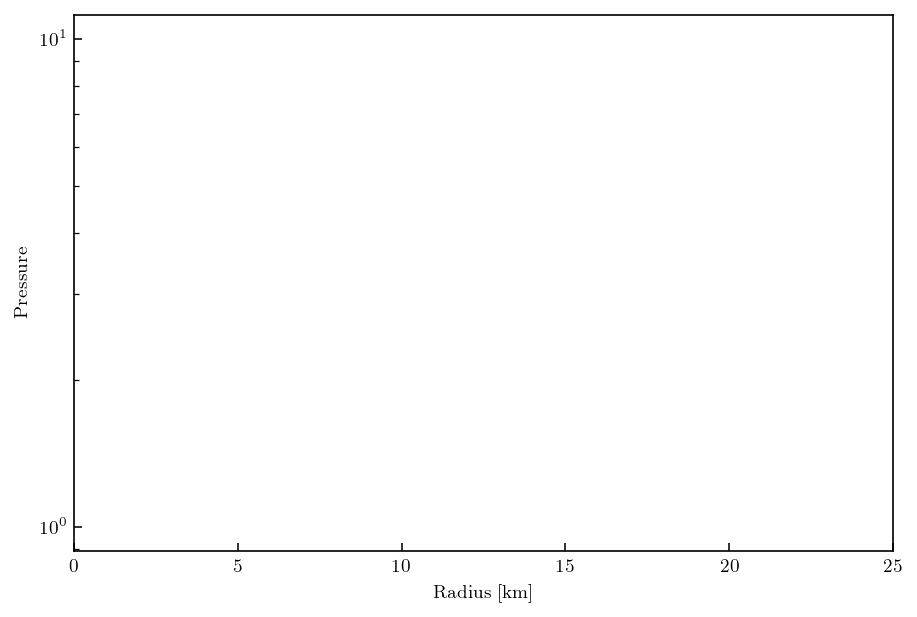

In [17]:
# Plot the data
fig, ax = plt.subplots(figsize=(6, 4), dpi=150)
for i in range(len(Sols_varying_p0)):
    ax.plot(Sols_varying_p0[i][0],Sols_varying_p0[i][1], alpha=0.5,color=plt.cm.viridis(pvals[i]), label=f"{pvals[i]:.2f}")
    ax.plot(radDMDArray[i], presDMDArray[i], alpha=0.5,color=plt.cm.viridis(pvals[i]), linestyle='dotted')

plt.xlim(0, 25)
# plt.ylim(0, 2.2)
plt.yscale('log')
# plt.xscale('log')
plt.xlabel("Radius [km]")
plt.ylabel("Pressure")
# plt.legend()

plt.savefig("pressurevsRadDMD.pdf")

[] []


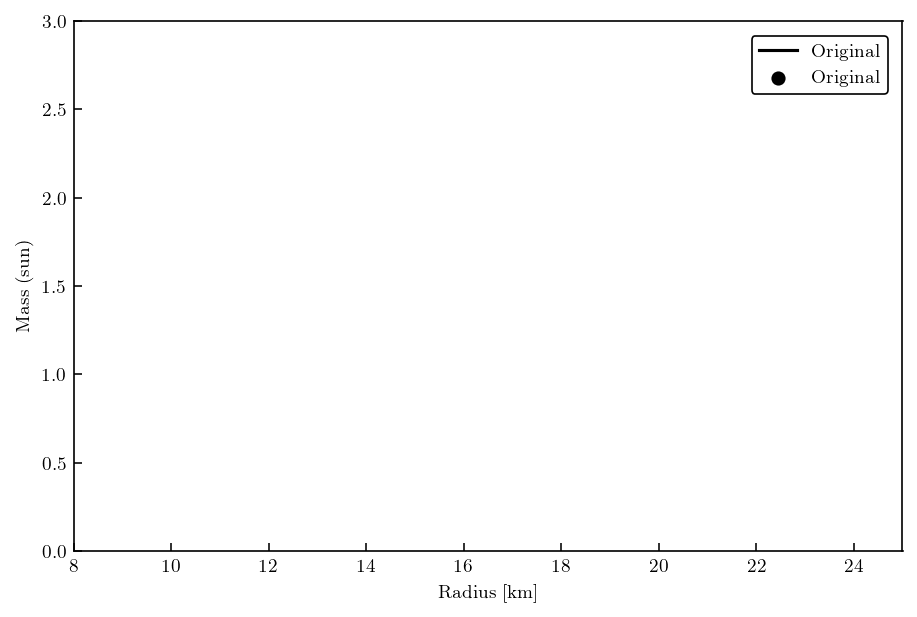

In [18]:
radius = []
mass = []
for i in range(len(Sols_varying_p0)):
    radius.append(Sols_varying_p0[i][0][-1])
    mass.append(Sols_varying_p0[i][2][-1])

radiusDMD = []
massDMD = []
for i in range(len(Sols_varying_p0)):
    radiusDMD.append(radDMDArray[i][-1])
    massDMD.append(massDMDArray[i][-1])

fig, ax = plt.subplots(figsize=(6, 4), dpi=150)
ax.plot(radius, mass, label="Original", color='k')
ax.scatter(radius, mass, color='k', label="Original")
# ax.scatter(radiusDMD, massDMD, label="DMD", color='r')
ax.scatter(radiusDMD, massDMD, color='r')
ax.set_ylim(0, 3)
ax.set_xlim(8, 25)
plt.xlabel("Radius [km]")
plt.ylabel("Mass (sun)")
plt.legend()
print(massDMD, radiusDMD)

[0.001916   0.00199771 0.0019974  0.00199707 0.00199672 0.00199633
 0.00199592 0.00199549 0.00199502 0.00199451 0.00199397 0.00199339
 0.00199277 0.00199211 0.00199139 0.00199063 0.00198981 0.00198893
 0.00198799 0.00198698 0.0019859  0.00198474 0.0019835  0.00198217
 0.00198075 0.00197922 0.00197758 0.00197583 0.00197395 0.00197194
 0.00196979 0.00196748 0.00196501 0.00196236 0.00195952 0.00195649
 0.00195324 0.00194976 0.00194604 0.00194206 0.0019378  0.00193324
 0.00192836 0.00192315 0.00191757 0.00191161 0.00190524 0.00189843
 0.00189115 0.00188338 0.00187509 0.00186624 0.00185679 0.00184671
 0.00183597 0.00182452 0.00181232 0.00179933 0.0017855  0.0017708
 0.00175516 0.00173855 0.00172091 0.0017022  0.00168236 0.00166134
 0.0016391  0.00161558 0.00159073 0.00156452 0.00153689 0.0015078
 0.00147722 0.00144513 0.00141148 0.00137628 0.00133951 0.00130117
 0.00126127 0.00121986 0.00117695 0.00113263 0.00108695 0.00104002
 0.00099194 0.00094286 0.00089292 0.00084231 0.00079123 0.000739

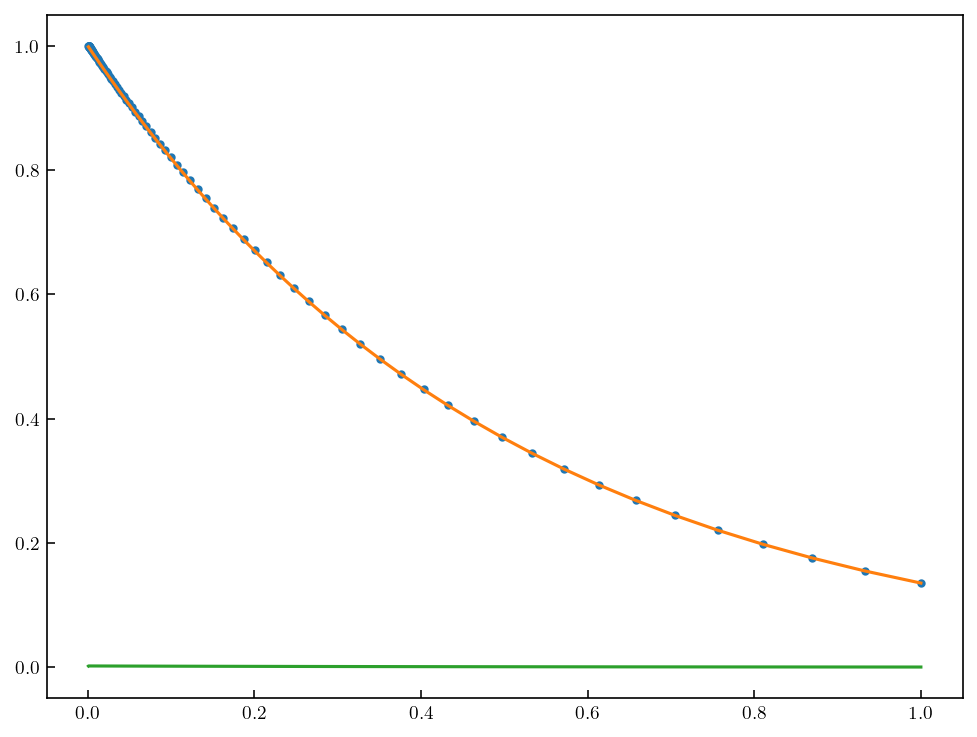

In [19]:
import matplotlib.pyplot as plt
import numpy as np
import time

def rk4_step(f, t, y, h):
    """
    Perform a single RK4 step with step size h.
    
    Parameters:
    -----------
    f  : function
        The derivative function f(t, y).
    t  : float
        Current time.
    y  : float or array
        Current value of y.
    h  : float
        Step size.
    
    Returns:
    --------
    y_next : float or array
        The next value of y.
    """
    k1 = f(t, y)
    k2 = f(t + h / 2, y + h / 2 * k1)
    k3 = f(t + h / 2, y + h / 2 * k2)
    k4 = f(t + h, y + h * k3)

    return y + (h / 6) * (k1 + 2 * k2 + 2 * k3 + k4)

def rk4_adaptive_solve_ivp(f, y0, t, tol=1e-12, h_max=0.01, h_min=1e-10, dense_output=False):
    """
    Optimized Adaptive RK4 method, similar to solve_ivp in SciPy.
    
    Parameters:
    -----------
    f   : function
        The derivative function f(t, y).
    y0  : float or array
        The initial condition(s) for y.
    t   : array-like
        Time points where the solution is required (can be non-equidistant or geomspace).
    tol : float, optional
        The relative tolerance for error control (default is 1e-12).
    h_max : float, optional
        Maximum allowed step size (default is 0.01).
    h_min : float, optional
        Minimum allowed step size (default is 1e-10).
    dense_output : bool, optional
        Whether to return a callable interpolant (default is False).

    Returns:
    --------
    y : numpy array
        Solution array for y at each time step in t.
    sol : callable, optional
        Dense output interpolant for y (if dense_output=True).
    """
    n = len(t)
    y = np.zeros((n, len(y0))) if isinstance(y0, np.ndarray) else np.zeros(n)
    y[0] = y0

    safety_factor = 0.9  # Safety factor for step size adjustment
    max_increase_factor = 1.5  # Maximum increase in step size
    min_decrease_factor = 0.1  # Minimum reduction in step size

    sol = []
    tn = t[0]
    yn = y0
    h = (t[1] - t[0])  # Initial step size

    for i in range(1, n):
        h_target = t[i] - t[i - 1]

        while tn < t[i]:
            if tn + h > t[i]:
                h = t[i] - tn  # Limit step size if exceeding target

            # Full RK4 step
            y_full = rk4_step(f, tn, yn, h)

            # Two half RK4 steps
            y_half_1 = rk4_step(f, tn, yn, h / 2)
            y_half_2 = rk4_step(f, tn + h / 2, y_half_1, h / 2)

            # Error estimate using step doubling
            error = np.linalg.norm(y_full - y_half_2) / np.maximum(np.linalg.norm(yn), tol)

            if error <= tol:
                # Accept step
                tn += h
                yn = y_half_2
                sol.append((tn, yn))  # Storing for dense output if needed
                h = min(h_max, h * max_increase_factor)  # Increase step size
            else:
                # Reduce step size
                h = max(h_min, h * max(safety_factor * (tol / error) ** 0.25, min_decrease_factor))
                if h < h_min:
                    raise RuntimeError(f"Step size too small to meet tolerance at t={tn}")

        y[i] = yn

    if dense_output:
        def interpolate(t_eval):
            return interpolate_solution(t_eval, sol)

        return y, interpolate

    return y

def interpolate_solution(t_eval, sol):
    """
    Linear interpolation for dense output, based on stored (t, y) pairs.
    
    Parameters:
    -----------
    t_eval : float or array-like
        The time point(s) where the interpolated solution is desired.
    sol    : list of tuples
        List of (t, y) pairs obtained during the adaptive step solution.

    Returns:
    --------
    y_eval : float or array
        Interpolated solution at t_eval.
    """
    t_vals, y_vals = zip(*sol)
    t_vals = np.array(t_vals)
    y_vals = np.array(y_vals)

    if isinstance(t_eval, (float, int)):
        idx = np.searchsorted(t_vals, t_eval) - 1
        t0, t1 = t_vals[idx], t_vals[idx + 1]
        y0, y1 = y_vals[idx], y_vals[idx + 1]
        return y0 + (y1 - y0) * (t_eval - t0) / (t1 - t0)
    else:
        y_eval = np.zeros_like(t_eval)
        for j, t_eval_j in enumerate(t_eval):
            idx = np.searchsorted(t_vals, t_eval_j) - 1
            t0, t1 = t_vals[idx], t_vals[idx + 1]
            y0, y1 = y_vals[idx], y_vals[idx + 1]
            y_eval[j] = y0 + (y1 - y0) * (t_eval_j - t0) / (t1 - t0)
        return y_eval

# Example usage with geomspace
def dydt(t, y):
    return -2 * y

# Initial condition
y0 = 1.0

# Geometrically spaced time steps
time_steps = np.geomspace(1e-3, 1, num=100)

# Call the RK4 method with adaptive step control for high accuracy and geomspace t
y_sol, sol_dense = rk4_adaptive_solve_ivp(dydt, y0, time_steps, tol=1e-12, dense_output=True)

# Get interpolated solution at any time point
t_eval = np.geomspace(1e-3, 1, num=100)  # Time points for evaluation

y_eval = sol_dense(t_eval)  # Interpolated solution

# print(y_sol)
# print(y_eval)

y_exact = np.exp(-2*time_steps)
diff = np.abs(y_eval - y_exact)
print(diff)
plt.plot(time_steps, y_sol, '.',label='Numerical')
plt.plot(time_steps, y_exact, label='Exact')
plt.plot(time_steps, diff, label='Error')


In [20]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import UnivariateSpline

# Your data
x = np.linspace(0, 10, len(Sols_varying_p0[-1][0]))  # Assuming x values are uniformly spaced
y = Sols_varying_p0[-1][0]

# Spline interpolation
spline = UnivariateSpline(x, y, s=0)  # s=0 for interpolation (through all points)

# Generate a smooth linspace
x_new = np.linspace(0, 10, 20)  # Adjust 500 for more/less points
y_new = spline(x_new)

# Plot the original data and the interpolated smooth curve
plt.plot(x, y, label='Original Data')
plt.plot(x_new, y_new, '.', label='Interpolated Spline')

plt.legend()
plt.show()


IndexError: list index out of range

/tmp/ipykernel_419357/1617850819.py:31: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


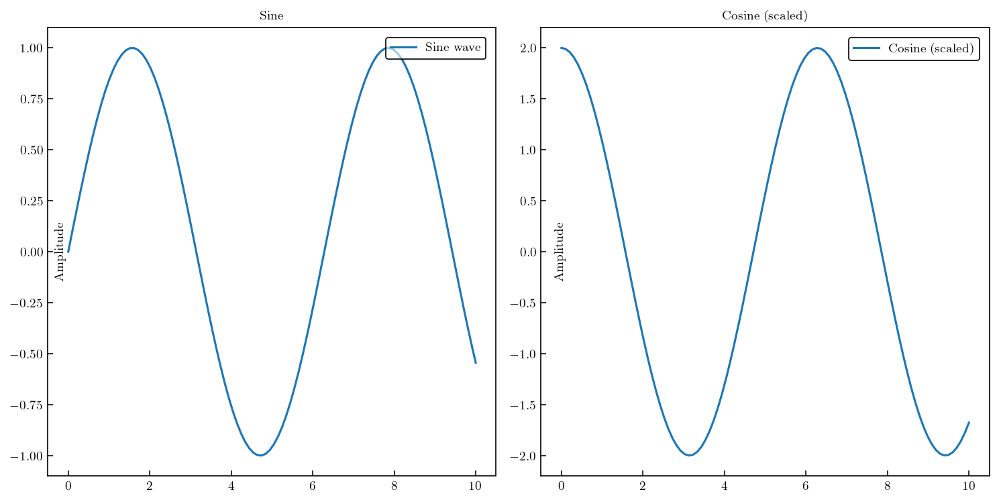

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Generate some data
x = np.linspace(0, 10, 100)
y1 = np.sin(x)
y2 = np.cos(x) * 2  # Different range for y2

# Create a figure with subplots
fig, axes = plt.subplots(1, 2, figsize=(10, 5))  # 1 row, 2 columns

# Plot on the first axis
axes[0].plot(x, y1, label='Sine wave')
axes[0].set_title('Sine')
axes[0].legend(loc='upper right')  # Legend inside plot
axes[0].set_ylabel('Amplitude', labelpad=-40)  # Move the label closer inside
axes[0].yaxis.set_label_position('left')  # Left is still default, but now inside the plot

# Plot on the second axis
axes[1].plot(x, y2, label='Cosine (scaled)')
axes[1].set_title('Cosine (scaled)')
axes[1].legend(loc='upper right')  # Legend inside plot
axes[1].set_ylabel('Amplitude', labelpad=-40)  # Move the label inside for the second plot
axes[1].yaxis.set_label_position('left')

# Set the same box aspect ratio to maintain the same shape for all plots
for ax in axes:
    ax.set_box_aspect(1)  # Set equal width and height for all plots

# Use tight layout to adjust the spacing
plt.tight_layout()
plt.show()
